Steps:
1. pick a station and get lat/lon of station
2. get hls l30 and s30 granules for that lat/lon going back to 2015
3. use dates of those hls granules to query for snow depth point data
4. save to a table for that station

In [1]:
# Imports
from datetime import datetime
import pandas as pd
import earthaccess
import requests
import rioxarray
from pyproj import Transformer
import pyarrow as pa
import pyarrow.parquet as pq

from helpers import SnotelHlsData

/Users/aimeebarciauskas/github/ski-project/ski-project/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 1. Set some constants

SNOTEL Station, period of interest

In [2]:
# Get lat/lon of SNOTEL stations
snotel_stations = pd.read_json("snotel-wa-stations.json")
snotel_api = "https://wcc.sc.egov.usda.gov/awdbRestApi/services/v1/data"
station_triplet = "908:WA:SNTL"
station_lat, station_lon = snotel_stations[snotel_stations.stationTriplet == station_triplet].latitude.values[0], snotel_stations[snotel_stations.stationTriplet == station_triplet].longitude.values[0]
start_date, end_date = '2013-01-01', '2025-12-31'
lpdaac_fs = earthaccess.get_fsspec_https_session()


# 2. Find HLS L30 and S30 data coincident with this SNOTEL station

In [3]:
earthaccess.login()
lpdaac_fs = earthaccess.get_fsspec_https_session()

In [4]:

hls_granules = []

for hls_collection in ['HLSL30', 'HLSS30']:
    hls_granules.extend(earthaccess.search_data(
        short_name=hls_collection,
        bounding_box=(station_lon, station_lat, station_lon, station_lat),
        temporal=(start_date, end_date)
    ))

len(hls_granules)

2439

# Intermission: Displaying HLS data and station


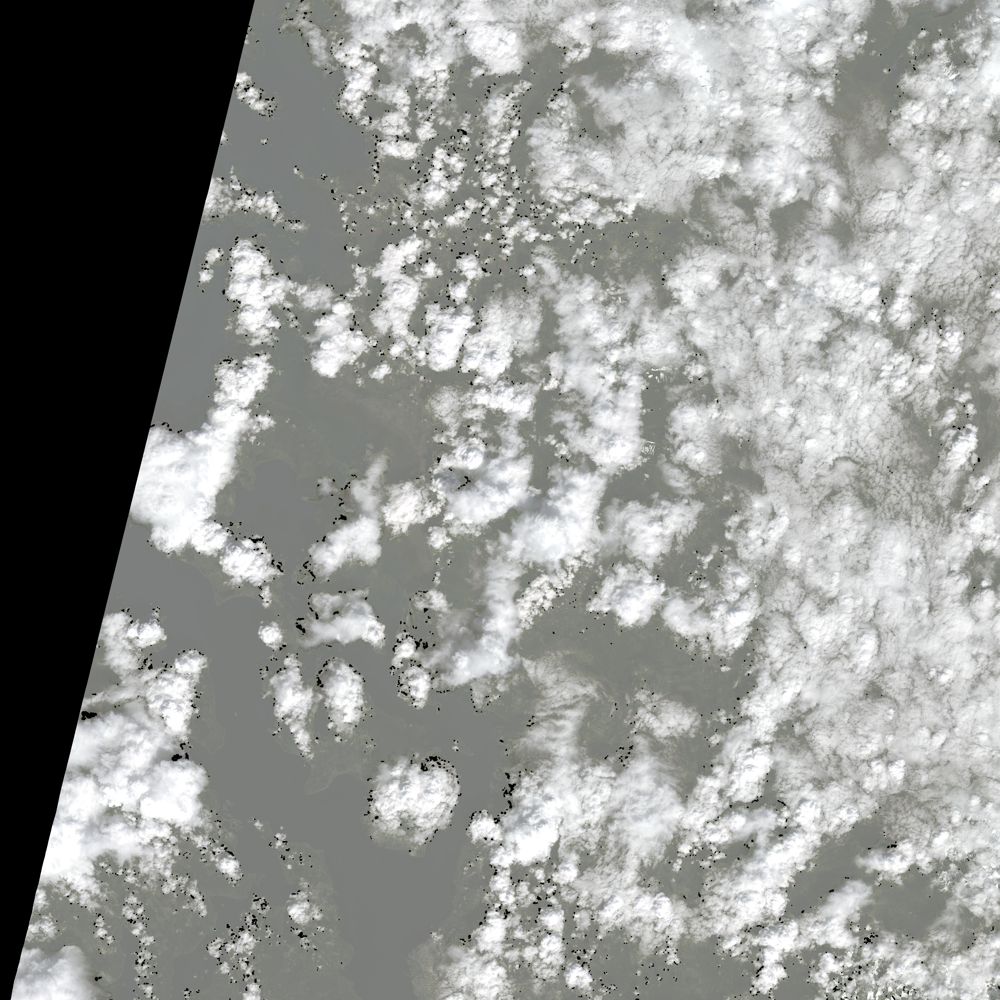

In [5]:

import base64
import folium
import io
from PIL import Image
import numpy as np
import rasterio
from IPython.display import HTML

first_granule = hls_granules[0]
bounding_points = first_granule["umm"]["SpatialExtent"]["HorizontalSpatialDomain"]["Geometry"]["GPolygons"][0]["Boundary"]["Points"]

latitudes = [point["Latitude"] for point in bounding_points]
longitudes = [point["Longitude"] for point in bounding_points]

hls_granule_bounds = [
    [min(latitudes), min(longitudes)],
    [max(latitudes), max(longitudes)]
]

bands_to_files = {link.split('/')[-1].split('.')[-2]: link for link in first_granule.data_links()}
bands_to_files

blue = rasterio.open(lpdaac_fs.open(bands_to_files['B02'])).read(1)
green = rasterio.open(lpdaac_fs.open(bands_to_files['B03'])).read(1)
red = rasterio.open(lpdaac_fs.open(bands_to_files['B04'])).read(1)

rgb = np.stack([red, green, blue], axis=0)

# Normalize the data for visualization (0-1 range)
def normalize_band(band):
    band_min = np.nanpercentile(band, 2)  # 2nd percentile
    band_max = np.nanpercentile(band, 98)  # 98th percentile
    return (band - band_min) / (band_max - band_min)

rgb_normalized = np.stack([
    normalize_band(red),
    normalize_band(green), 
    normalize_band(blue)
], axis=0)

# Clip to valid range
rgb_normalized = np.clip(rgb_normalized, 0, 1)

# Convert to 8-bit (0-255)
rgb_8bit = (rgb_normalized * 255).astype(np.uint8)

# Convert your rgb_8bit to base64
rgb_image = Image.fromarray(np.transpose(rgb_8bit, (1, 2, 0)))
img_buffer = io.BytesIO()
rgb_image.save(img_buffer, format='PNG')
img_buffer.seek(0)
img_str = base64.b64encode(img_buffer.read()).decode()


# Create the map
m = folium.Map(
    location=[station_lat, station_lon],
    zoom_start=7,
    tiles='OpenStreetMap'
)

folium.raster_layers.ImageOverlay(
    name='True Color Image',
    image=f'data:image/png;base64,{img_str}',
    bounds=hls_granule_bounds,
    opacity=0.8,
    popup='HLS True Color Image'
).add_to(m)

folium.CircleMarker(
    location=[station_lat, station_lon],
    radius=5,
    color='green',
    fill=True,
    fillOpacity=0.7
).add_to(m)

# Display with custom size using HTML
html = m._repr_html_()
html_with_size = f'<div style="width: 500px; height: 500px;">{html}</div>'
HTML(html_with_size)


# Create Parquet Table

In [6]:
parquet_file = 'snotel_data.parquet'

schema = pa.schema([
    ('date', pa.string()),
    ('snow_depth', pa.int16()),
    ('B01', pa.int16()),
    ('B02', pa.int16()),
    ('B03', pa.int16()),
    ('B04', pa.int16()),
    ('B05', pa.int16()),
    ('B06', pa.int16()),
    ('B07', pa.int16()),
    ('B08', pa.int16()),
    ('B09', pa.int16()),
    ('B10', pa.int16()),
    ('is_snow', pa.int8()),
    ('granule_id', pa.string()),
    ('station_triplet', pa.string()),  
])

# schema

In [44]:
create_new = True
if create_new == True:
    empty_table = schema.empty_table()
    pq.write_table(empty_table, parquet_file)

In [29]:
# Function for appending new data to parquet file
def append_items(file_path, new_data):
    new_table = pa.table(new_data, schema=schema)
    
    # Read existing data and append
    existing_table = pq.read_table(file_path)
    combined_table = pa.concat_tables([existing_table, new_table])
    
    # Write back to file
    pq.write_table(combined_table, file_path)

# For each granule

1. Get SNOTEL snow depth data for the same date
2. Read band data for the lat/lon of the SNOTEL data
3. Write to the parquet table

In [30]:
import helpers
from importlib import reload

# ... (make changes to my_module.py)

reload(helpers)



<module 'helpers' from '/Users/aimeebarciauskas/github/ski-project/helpers.py'>

In [51]:
snotel_data_items = []
from typing import Dict, Any
from concurrent.futures import ThreadPoolExecutor, as_completed
from datetime import datetime
import helpers


def process_granule_parallel(args: tuple) -> Dict[str, Any]:
    """Process a single granule in parallel"""
    fs, granule, lat, lon, station_triplet = args
    try:
        snotel_data = helpers.SnotelHlsData(fs, granule, lat, lon, station_triplet)
        snotel_data.set_date()
        snotel_data.set_3857_latlon()        
        snotel_data.set_snow_depth()
        snotel_data.set_hls_band_data()
        return snotel_data
    except Exception as e:
        print(f"Error processing granule {granule.get('meta', {}).get('concept-id', 'unknown')}: {e}")
        return None

batch_size = 10
start_idx = 100
end_idx = len(hls_granules)
max_workers = 10
for i in range(start_idx, end_idx, batch_size):
    args_list = [(lpdaac_fs, granule, station_lat, station_lon, station_triplet) for granule in hls_granules[i:i+batch_size]]
    print(f"Processing granules {i} to {i+batch_size} of {len(hls_granules)}")
    results = []

    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        # Submit all tasks
        future_to_granule = {
            executor.submit(process_granule_parallel, args): args[1] 
            for args in args_list
        }
        
        # Process completed tasks
        for future in as_completed(future_to_granule):
            granule = future_to_granule[future]
            try:
                result = future.result()
                if result is not None:
                    results.append(result)
                    print(f"Successfully processed granule {granule.get('meta', {}).get('concept-id', 'unknown')}")
            except Exception as e:
                print(f"Exception in granule {granule.get('meta', {}).get('concept-id', 'unknown')}: {e}")

    append_items(parquet_file, helpers.for_parquet_insert(results))


Processing granules 100 to 110 of 2439
Successfully processed granule G2226175589-LPCLOUD
Successfully processed granule G2226719054-LPCLOUD
Successfully processed granule G2227076998-LPCLOUD
Successfully processed granule G2226187082-LPCLOUD
Successfully processed granule G2225983470-LPCLOUD
Successfully processed granule G2227079685-LPCLOUD
Successfully processed granule G2226526694-LPCLOUD
Successfully processed granule G2226734266-LPCLOUD
Successfully processed granule G2226529696-LPCLOUD
Successfully processed granule G2225986905-LPCLOUD
Processing granules 110 to 120 of 2439
Successfully processed granule G2224306964-LPCLOUD
Successfully processed granule G2224471137-LPCLOUD
Successfully processed granule G2224158916-LPCLOUD
Successfully processed granule G2224910856-LPCLOUD
Successfully processed granule G2225081363-LPCLOUD
Successfully processed granule G2224911161-LPCLOUD
Successfully processed granule G2225433173-LPCLOUD
Successfully processed granule G2225431257-LPCLOUD
Succ

Each 10 granules take about 60 seconds to process. Since we have about 2500 granules, this will take 4 hours.

In [52]:
import pandas as pd

df = pd.read_parquet(parquet_file)

In [53]:
df

,date,snow_depth,B01,B02,B03,B04,B05,B06,B07,B08,B09,B10,is_snow,granule_id,station_triplet
0,2013-05-16T18:58:02.239Z,98,8296,8357,8089,8144,8218,5086,3496,-9999,71,-200,0,G2244112616-LPCLOUD,908:WA:SNTL
1,2013-06-17T18:58:00.052Z,45,3772,3919,4101,4186,5370,4187,3659,-9999,38,511,0,G2243376235-LPCLOUD,908:WA:SNTL
2,2013-06-01T18:57:42.304Z,81,-36,315,1365,1265,2617,1560,1306,-9999,76,14,0,G2243742131-LPCLOUD,908:WA:SNTL
3,2013-05-16T18:57:38.352Z,98,8275,8336,8063,8119,8197,5071,3485,-9999,71,-200,0,G2244115102-LPCLOUD,908:WA:SNTL
4,2013-04-14T18:57:28.350Z,152,8529,8680,8337,8379,8780,5017,3851,-9999,239,-1004,0,G2246989005-LPCLOUD,908:WA:SNTL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2427,2025-08-14T19:11:14.510Z,1,7199,6964,7085,6935,7023,7204,7328,7266,2052,83,0,G3655823636-LPCLOUD,908:WA:SNTL
2428,2025-08-17T19:21:25.576Z,1,5303,5176,5361,5283,5510,5983,6104,6215,2645,346,0,G3660029404-LPCLOUD,908:WA:SNTL
2429,2025-08-14T19:21:21.879Z,1,5924,5564,5717,5668,5849,6257,6373,6327,1796,70,0,G3655696574-LPCLOUD,908:WA:SNTL
2430,2025-08-19T19:11:46.325Z,1,1803,1848,1899,2025,2448,3512,3802,3840,1312,85,0,G3662637292-LPCLOUD,908:WA:SNTL
